# Building a Vision Transformer

In recent times the field of computer vision has evolved rapidly from complex vision model architectures in the early days of AlexNet and the likes. These models mainly focused on Convolutional Neural Networks as the backbone feature extractor for image feature extraction. These models achieved SOTA results in many tasks such as image classification, object detection, localisation and semantic segementation. These models, trained on imagenet datasets which is a huge dataset containing over a million images of 1000 (approximate) categories performed exceptionally well on out-of-sample data. Some of these models include resnet and VGG16 models and later versions. These models were designed with dense and highly stacked layers of CNN layers configured with tunable hyperparameters to achieve great results. In recent times following the rise of language models specifically the Transformer model, were a paper written by Vawani et al, made a breakthrough in the field of NLP in a book titled 'Attention is all you need', specified that in any given sequence, if we can a model that can focus attentively on key aspects of a sequence, then we can get it to understand the contextual meaning of text.Later on, a group of scientists based on the Transformer architecture figured out that an image is just a 16x16 pixel sequence which is more or less like a sequence of text tokens, and hence the Vision Transformer was born.

In this notebook I will demonstrate how a vision transformer model ingests and processes images from start to predicition(image classification or object detection if possible). the notebook provides a concise comment which details each step of the code to implement

In [1]:
try:
    import torchvision
    import torchmetrics
    import torchinfo
except ModuleNotFoundError:
    print('[INFO] modules not found installing......')
    !pip install -U torchvision torchinfo torchmetrics -q
    import torchmetrics
    import torchinfo

In [134]:
import nbformat

# Load your notebook
nb = nbformat.read("Pytorch-Vision-Transfomer.ipynb", as_version=nbformat.NO_CONVERT)

# Remove widgets metadata if present
if "widgets" in nb.metadata:
    del nb.metadata["widgets"]

# Save back
nbformat.write(nb, open("Pytorch-Vision-Transfomer-fixed.ipynb", "w"))
print("Notebook metadata cleaned ✅")

FileNotFoundError: [Errno 2] No such file or directory: 'Pytorch-Vision-Transfomer.ipynb'

In [2]:
#import libraries
import torch
from torch import nn as nn
import matplotlib.pyplot as plt
import pathlib as path
import zipfile
import requests
import pandas as pd
from torch.nn import functional as F
import numpy as np
from typing import List, Dict, Tuple,Literal
from PIL import Image
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Dataset
from collections import OrderedDict
import os
from contextlib import nullcontext
import random
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import random_split

In [3]:
##get data
#now to get data, you can choose to either upload a zipfile to your colab or extract from a url
#i will use the former-upload to a colab
def data_extractor(folder_name:str,zipfile_name:str):
    data_path = '/content/'
    file_path = data_path + f'{folder_name}'

    if not os.path.exists(file_path):
        print(f'[INFO] {file_path} directory does not exist, creating...')
        os.makedirs(name=file_path, exist_ok=True)
    else:
        print('[INFO] directory already exists, skipping...')
        pass

#unzip
    with zipfile.ZipFile(f'./{zipfile_name}.zip','r') as zipref:
        zipref.extractall(file_path)

In [4]:
#test the function
data_extractor(folder_name='image_data',zipfile_name='image_data')

[INFO] directory already exists, skipping...


In [5]:
##now that you have your images, lets view some
images = list(path.Path('/content/image_data').glob('*/*/*.jpg'))
print(f'total number of images in directory:{len(images)}')

total number of images in directory:13438


In [6]:
#select random samples from the list of images
def image_viewer(image_path:str, sample_size:int,figsize=Tuple[int,int]):
    images = list(path.Path(f'{image_path}').glob('*/*.jpg'))
    random_sample = random.sample(population=images,k=sample_size)
    plt.figure(figsize=figsize)
    for idx,image in enumerate(random_sample,start=1):
        plt.subplot(1,len(random_sample),idx)
        img = Image.open(image)
        img_np = np.array(img)
        plt.imshow(img_np)
        plt.title(f'{img_np.shape}')
        plt.axis('off')

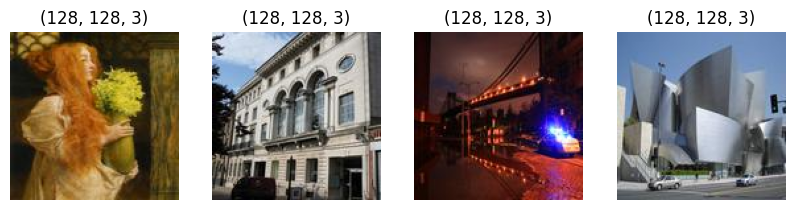

In [7]:
#test the function
image_viewer(image_path='/content/image_data/training_set',sample_size=4,figsize=(10,4))

In [8]:
##lets get the classes of images with os.scandir()
classes = list(os.listdir('/content/image_data/training_set'))
print(f'there are {len(classes)} classes which include these categories:\n {classes}')

there are 2 classes which include these categories:
 ['flower', 'car']


Before you can build any vision model, it is imperative that, the data(image) must be processed especially for the images in the train dataset. These preprocessing includes resizing or cropping and even sometimes padding. For the task of the vision transformer, each image needs to resized and broken down into patches of size NxN.
In the original vision transformer paper, the authors stated they used a patch size of 16x16.in this notebook I will experiment on 16x16 patch size for 224 by 224 image

In [9]:
#under normal circumstances, torchvision.datasets has an ImageFolder function that allows the creation of image classification datasets
#but for this case, it is imperative to create a custom dataset function that will create the patches and the embeddings

class Patch_Embeddings(nn.Module):
    def __init__(self,patch_size,embed_dim):
        super().__init__()
        self.patch_size = patch_size
        self.embed_dim = embed_dim
        self.conv2d = nn.Conv2d(in_channels=3, out_channels=self.embed_dim, kernel_size=self.patch_size, stride=self.patch_size) #produces patches of shape (1,768,14,14)
        self.flatten = nn.Flatten(start_dim=2, end_dim=3) #flattens the output from the conv2d to (None,768,196)

    def forward(self,x:torch.Tensor)->torch.Tensor:
        x = self.conv2d(x)
        x = self.flatten(x)
        x = x.permute(0,2,1) #rearranges the flattened output from (1,768,196)->(1,196,768)
        return x

In [10]:
#test the patch embeddings class
p_embed = Patch_Embeddings(patch_size=16,embed_dim=768)

#setup random image with torch.randn()
random_image = torch.randn(size=(32,3,224,224))

p_embed(random_image).shape

torch.Size([32, 196, 768])

In [11]:
##lets look at the summary of the patch_embeddings
torchinfo.summary(Patch_Embeddings(patch_size=16,embed_dim=768),input_size=random_image.shape)

Layer (type:depth-idx)                   Output Shape              Param #
Patch_Embeddings                         [32, 196, 768]            --
├─Conv2d: 1-1                            [32, 768, 14, 14]         590,592
├─Flatten: 1-2                           [32, 768, 196]            --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 3.70
Input size (MB): 19.27
Forward/backward pass size (MB): 38.54
Params size (MB): 2.36
Estimated Total Size (MB): 60.17

In [12]:
##the tensor above: (1,196,768)->(batch_size,num_patches,embed_dim_per_patch)

In [13]:
torch.randn(1,768).shape

torch.Size([1, 768])

In [14]:
##now that we have the patch_embedding maker, define the postional embeddings
class Patch_positions(nn.Module):
    def __init__(self,num_patches,embed_dim):
        super(Patch_positions,self).__init__()
        self.num_patches = num_patches
        self.embed_dim = embed_dim

        self.class_tokens = nn.Parameter(torch.randn(1,self.embed_dim),requires_grad=True) #learnable class token to be added to the number of patches usually at the first index

        #num_patches is increased by +1 so that it can accommodate the class_token
        self.patch_positions = nn.Parameter(torch.randn(self.num_patches + 1,self.embed_dim),requires_grad=True) #uses the nn.Parameter to shift the embedding in embed_dim for each patch(token) also learnable

    def forward(self,x:torch.Tensor)->torch.Tensor:
        class_tokens = self.class_tokens.expand(x.shape[0], -1, -1) #use the expand method to change the view of the class token from (1,768)->(1,1,768)

        # use torch.cat() to prepend(add) the class_token(special-learnable) to the input tensor from the patch_embedding of shape(1,196,768)
        return torch.cat((class_tokens, x), dim=1) + self.patch_positions

In [15]:
##test the patch_positions
random_image = random_image #from above

p_emb = p_embed(random_image)
print('original embeddings of patches:', p_emb)
print('\n shape of original embeddings:',p_emb.shape)

#apply the positions
patch_pos = Patch_positions(num_patches=196,embed_dim=768)

#view
print('patch embeddings after applying the positional embeddings:\n',patch_pos(p_emb))
print('patch embeddings shape after applying the positional embeddings:\n',patch_pos(p_emb).shape)

original embeddings of patches: tensor([[[ 0.3402, -0.3755,  0.1913,  ...,  0.0521,  0.1888,  0.8587],
         [ 0.3931,  0.9024, -0.0276,  ...,  1.4744,  0.7252, -0.6492],
         [ 0.2861, -0.5260, -0.3751,  ..., -0.2451,  0.5881,  0.5813],
         ...,
         [ 0.5565, -0.6369, -0.1896,  ..., -0.3735, -0.7999, -0.4207],
         [-0.2257, -0.5692, -0.3274,  ...,  0.2292,  0.2685,  0.7421],
         [-0.8778, -0.2224,  0.8810,  ...,  0.3928, -0.5322,  0.4332]],

        [[-0.5274,  0.5514,  0.2080,  ...,  0.4087,  0.0440, -0.3004],
         [ 0.8326,  0.0952, -1.1687,  ..., -1.4764, -0.3227,  0.3717],
         [-0.4645,  0.3207, -0.9013,  ..., -0.4396,  0.2151,  0.4775],
         ...,
         [-0.2021,  0.8903, -1.4130,  ..., -0.0730,  0.1037,  0.0187],
         [ 1.3493,  0.3598, -0.1875,  ...,  0.3620,  1.3396,  0.6196],
         [-0.0221, -0.2443,  0.0289,  ...,  0.3783,  0.1865, -0.0321]],

        [[ 0.8538,  0.0451,  0.1623,  ..., -0.1548,  0.1484, -0.5450],
         [ 1.

In [16]:
##lets look at the summary of the patch_encoder
torchinfo.summary(Patch_positions(num_patches=196,embed_dim=768),input_size=(32,196,768),col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Trainable
Patch_positions                          [32, 196, 768]            [32, 197, 768]            True
Total params: 152,064
Trainable params: 152,064
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 19.27
Forward/backward pass size (MB): 38.73
Params size (MB): 0.61
Estimated Total Size (MB): 58.61

In [17]:
#just a simple mathematical operation to show how the number of patches arw retrieved from an image
224//16 * 224//16

196

In [18]:
#since we will only need the patches to train the model not to test it,
#the customdataset function will only be applied to the train_data
##now combine these into another class that takes in the patch_embeddings + positional encoding
class CustomImageDataset(torch.utils.data.Dataset):
    """
    Takes in the images in the train directory and applies transformations, patching and positional embedding

    """
    def __init__(self,root:str,
                 transform:torchvision.transforms,
                 embed_dim:int,
                 image_size:int,
                 patch_size:int):
        super(CustomImageDataset,self).__init__()
        self.image_size = image_size
        self.patch_size = patch_size
        self.num_patches = (self.image_size//self.patch_size)*(self.image_size//self.patch_size)
        self.embed_dim = embed_dim
        self.transform=transform
        self.root = root
        self.patch_embeddings = Patch_Embeddings(patch_size=self.patch_size,embed_dim=self.embed_dim)
        self.position_embeddings = Patch_positions(num_patches=self.num_patches,embed_dim=self.embed_dim)
        self.classes = os.listdir(self.root)
        self.class_index = {name:i for i,name in enumerate(self.classes,start=1)}
        self.images = [] #create an empty list to store images and class
        for classes in self.classes:
            class_dir = os.path.join(self.root,classes)
            for images in os.listdir(class_dir):
                self.images.append((os.path.join(class_dir,images),self.classes.index(classes)))

    def class_idx(self):
        """Returns the unique classes and their index"""
        return self.class_index

    def classes(self):
        """Returns the unique classes """
        return self.classes

    def __len__(self):
        """Returns the length of the specific dataset"""
        return len(self.images)

    def __getitem__(self,index):
        """
        For each image path in the list of images.
        Selects all indexes and executes the transfomrs + patch embeddings + pos_encoding
        """
        image_path,label = self.images[index]

        image = Image.open(image_path).convert('RGB')

        image = self.transform(image)

        #pass image through the patches maker
        patches = self.patch_embeddings(image.unsqueeze(dim=0)) # unsqueeze at dim=0 to add a batch dimension

        pos_enc = self.position_embeddings(patches)

        return pos_enc.squeeze(dim=0),label #squeeze the

In [19]:
#test the module
train_dir = '/content/image_data/training_set'
test_dir = '/content/image_data/test_set'

In [20]:
os.listdir(train_dir)

['flower', 'car']

In [21]:
#setup image transformations
transformations = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.TrivialAugmentWide(num_magnitude_bins=31),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485,0.456,0.506],std=[0.229,0.224,0.225]) #set a normalizer for the image RGB tensors/channels
])

In [22]:
train_dataset = CustomImageDataset(root=train_dir,transform=transformations,embed_dim=768,image_size=224,patch_size=16)

In [23]:
train_dataset.class_idx()

{'flower': 1, 'car': 2}

In [24]:
#create a dataloader
train_dataloader = DataLoader(dataset=train_dataset,batch_size=64,shuffle=True)

In [25]:
images,labels = next(iter(train_dataloader))

In [26]:
images.shape

torch.Size([64, 197, 768])

In [27]:
class_names = train_dataset.classes
class_names

['flower', 'car']

In [28]:
#function to view image patches
def view_patches(image,img_size:int,
                 patch_size:int,num_patches:int):
    fig, axs = plt.subplots(nrows=img_size // patch_size,
                        ncols=img_size // patch_size,
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)
    img = Image.open(image)
    #img = np.array(img)
    img = transformations(img) #makes it a tensor
    img = img.permute(1,2,0) #permute the indexes for matplotlib library. from (color_channel,height,width)->(height,width,color_channel)

# Loop through height and width of image
    for i, patch_height in enumerate(range(0, img_size, patch_size)): #loop through the number of patches from the height(patch_size and image_size)
        for j, patch_width in enumerate(range(0, img_size, patch_size)): #loop through the number of patches from the width

            axs[i, j].imshow(img[patch_height:patch_height+patch_size,
                                        patch_width:patch_width+patch_size,
                                        :].clamp(0, 1))
            axs[i, j].set_ylabel(i+1,
                             rotation="horizontal",
                             horizontalalignment="right",
                             verticalalignment="center")
            axs[i, j].set_xlabel(j+1)
            axs[i, j].set_xticks([])
            axs[i, j].set_yticks([])
            axs[i, j].label_outer()
    plt.show()

In [29]:
images = list(path.Path(f'{train_dir}').glob('*/*.jpg'))
random_sample = random.sample(population=images,k=4)
random_sample

[PosixPath('/content/image_data/training_set/car/fca1caa7108ac95d.jpg'),
 PosixPath('/content/image_data/training_set/flower/f3d3a14681c00dcc.jpg'),
 PosixPath('/content/image_data/training_set/car/f1945ddd8db9784e.jpg'),
 PosixPath('/content/image_data/training_set/car/f2bd268957602734.jpg')]

In [30]:
image = random_sample[0]

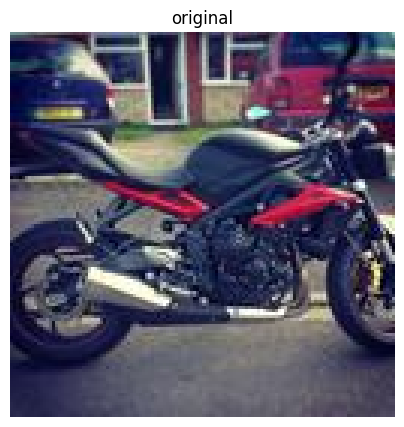

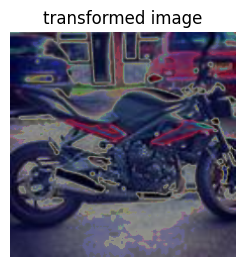

<Figure size 640x480 with 0 Axes>

In [31]:
plt.figure(figsize=(12,5))

plt.subplot(1,1,1)
img = Image.open(image)
img_np=np.array(img)
plt.imshow(img_np)
plt.axis('off')
plt.title('original')
plt.show()

plt.subplot(1,2,1)
img = transformations(img)
plt.imshow(img.permute(1,2,0).clamp(0,1))
plt.axis('off')
plt.title('transformed image')
plt.show()
plt.tight_layout()

In [32]:
view_patches(image=image,patch_size=16,img_size=224,num_patches=196)

The images above are patches retrieved from the image. And they showcase how the CNN produces feature maps from the image given.

In [33]:
##lets view how the patch_embeddings from the custom data
images,labels = next(iter(train_dataloader))

#get one image and label
image,label = images[0],labels[0]

In [34]:
image.shape

torch.Size([197, 768])

In [35]:
##use a pd.DataFrame to view it in a dataframe form
#since the image of shape torch.size([197,768]), in order to use it in a dataframe, it has to be cdetached and converted to nunmpy
pd.DataFrame(image.detach().numpy())

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.975677,0.977608,-0.721035,1.042060,1.181451,-1.538861,-1.109919,0.435046,-0.570828,1.393744,...,-0.039371,0.594043,-1.219186,-1.201129,1.659977,0.363155,0.063642,-1.603059,0.574718,-1.604507
1,-0.111993,-0.037575,0.223182,0.633177,1.086189,-0.934157,-0.037458,-0.148330,0.737280,0.548616,...,-0.218398,0.155318,1.410502,0.441140,0.717673,0.538345,-0.400156,-0.671888,0.244646,0.263097
2,0.123553,-1.418756,-0.413960,0.344688,0.355039,1.224120,0.000283,0.265633,0.849330,0.216149,...,-0.133278,0.352388,2.406579,-0.356589,-1.058045,1.438289,-1.271833,-1.458436,0.286384,-0.359708
3,-0.960193,-0.957190,0.727439,0.282879,-2.153760,0.706707,0.148319,-0.458965,-0.879115,0.751043,...,-1.428813,0.996886,-0.125980,-1.440643,-0.617281,0.118919,1.254801,-1.867220,1.059515,2.652590
4,0.100848,-1.474486,-0.803738,0.371921,1.059957,0.548437,-0.154029,-0.005098,1.358733,1.522735,...,-0.983896,0.346286,2.091689,0.968488,1.590173,1.035255,0.072417,0.601588,0.912310,2.609187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,0.090311,-0.257283,-0.228695,0.355977,-0.113907,0.245580,0.224520,0.904850,-1.127709,1.872123,...,-0.515196,0.688514,-0.246841,-0.529756,-0.226818,0.972355,0.025375,-1.500205,0.885760,0.141068
193,-0.519074,-2.821375,-0.737612,0.747160,-1.372086,-0.141959,0.513925,1.998459,-0.087247,0.183439,...,0.605321,0.741011,0.443632,0.487241,1.350431,-1.062066,2.816300,0.607245,-0.537872,1.591228
194,0.562965,-0.090212,-1.154082,1.278311,1.120439,-0.328660,0.478621,-0.594777,-1.195228,0.125493,...,0.932990,-0.712958,1.107774,0.108199,1.100882,0.304995,1.505316,0.254449,-0.382169,1.575140
195,0.946096,-0.674463,-1.526080,0.030384,0.156126,-1.083792,-1.129779,-1.097577,-0.305938,-0.677777,...,-0.108944,-0.675111,-0.449715,-0.086023,2.028971,0.451876,-1.120232,0.967217,0.581871,1.126053


The dataframe shows on each row the number of patches and on each column the embedding dimension encoded with the positions of each patch in the image. Inside the dataframe, the index 0 is likely the class_token

In [36]:
##create a test dataset with ImageFolder
test_dataset = ImageFolder(root=test_dir,transform=transforms.ToTensor(),target_transform=None)

In [37]:
##create a test dataloader
test_dataloader = DataLoader(dataset=test_dataset,batch_size=64,shuffle=True)

In [38]:
#how many images are in the test dataloader
print(f'there are {len(test_dataloader)} batches in the test dataset with {test_dataloader.batch_size} samples per batch')
#how many aee in the train dataloader
print(f'there are {len(train_dataloader)} batches in the train dataset with {train_dataloader.batch_size} samples per batch')

there are 42 batches in the test dataset with 64 samples per batch
there are 169 batches in the train dataset with 64 samples per batch


In the above section, I demonstrated how a single input image of shape (3,height,width) can be patched using the torch.nn.Conv2d, and then use a nn.Flatten() fucntion to flatten the feature maps from the convolutional layer. This creates patches with dimension=768 and the number of patches which is as

In [39]:
#create a subclass of the nn.Module to create the MSA which is the first layer in the Encoder
class MSA(nn.Module):
    def __init__(self,embed_dim:int,num_heads:int,dropout_rate:int,bias:bool):
        super(MSA,self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.dropout = dropout_rate
        self.bias = bias
        self.attn = nn.MultiheadAttention(embed_dim=self.embed_dim,num_heads=self.num_heads,dropout=self.dropout,bias=self.bias,kdim=self.embed_dim,
                                          vdim=self.embed_dim,batch_first=True)
        self.layer_norm = nn.LayerNorm(normalized_shape=self.embed_dim)

    def forward(self,x:torch.Tensor)->torch.Tensor:
        x = self.layer_norm(x) #normalize the input tensor

        attn_output = self.attn(query=x,key=x,value=x,need_weights=True) #returns a tuple

        add = torch.add(attn_output[0],x) #add the weight representations to the original input sequence embeddings

        return add

In [40]:
msa = MSA(embed_dim=768,num_heads=1,dropout_rate=0.01,bias=True)

In [41]:
##configure a random image
image_ = torch.randn(3,224,224)
print('original image shape=',image_.shape)

#pass through the patch_embedding
image_embed = p_embed(image_.unsqueeze(dim=0))
print('patch embeddings shape=',image_embed.shape)

#pass through the postional encoding with class_token added
image_embed_pos = patch_pos(image_embed)
print('positional and class token shape=',image_embed_pos.shape,'and dtype=',image_embed_pos.dtype)


original image shape= torch.Size([3, 224, 224])
patch embeddings shape= torch.Size([1, 196, 768])
positional and class token shape= torch.Size([1, 197, 768]) and dtype= torch.float32


In [42]:
#test the MSA with the input from the image_embed_pos
print('output of the MSA: with shape=',msa(image_embed_pos).shape,'\n')
msa_output = msa(image_embed_pos)
msa_output

output of the MSA: with shape= torch.Size([1, 197, 768]) 



tensor([[[ 0.3030, -1.6638,  0.5793,  ..., -0.2253,  0.7259,  0.0182],
         [-3.4398,  0.3758, -0.4675,  ...,  0.0528,  0.8750, -3.4921],
         [ 1.7961,  0.8665, -0.2846,  ..., -0.9851, -0.3405,  0.0166],
         ...,
         [ 1.6359,  0.3511, -1.7906,  ..., -0.5246, -0.0501, -1.1182],
         [ 0.5539, -1.0541,  0.6482,  ...,  2.2609, -0.6104,  0.2671],
         [ 1.9554, -0.8659, -1.3535,  ..., -1.9519,  1.5693,  0.0051]]],
       grad_fn=<AddBackward0>)

In [43]:
#run torchinfo.summary
torchinfo.summary(msa,input_size=image_embed_pos.shape,col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Trainable
MSA                                      [1, 197, 768]             [1, 197, 768]             True
├─LayerNorm: 1-1                         [1, 197, 768]             [1, 197, 768]             True
├─MultiheadAttention: 1-2                --                        [1, 197, 768]             True
Total params: 2,363,904
Trainable params: 2,363,904
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.00
Input size (MB): 0.61
Forward/backward pass size (MB): 1.21
Params size (MB): 0.01
Estimated Total Size (MB): 1.82

It is time to configure the MLP or FeedForward Network

In [44]:
#subclass the nn.Module
class MLP(nn.Module):
    def __init__(self,embed_dim:int,hidden_size:int,dropout:float,scale_factor:int):
        super(MLP,self).__init__()
        self.embed_dim = embed_dim
        self.hidden_size=hidden_size
        self.dropout=dropout
        self.scale_factor=scale_factor
        self.linear_layer = nn.Sequential(
            OrderedDict([
                ('Linear_1',nn.Linear(in_features=self.embed_dim,out_features=self.hidden_size*self.scale_factor)),
                ('Non_linear_add',nn.ReLU()),
                ('dropout',nn.Dropout(p=self.dropout)),
                ('Linear_2',nn.Linear(in_features=self.hidden_size*self.scale_factor,out_features=self.embed_dim)),
                ('dropout',nn.Dropout(p=self.dropout))
            ])
        )
        self.layer_norm = nn.LayerNorm(normalized_shape=self.embed_dim)
    def forward(self,x:torch.Tensor)->torch.Tensor:
        x = self.layer_norm(x)
        x = self.linear_layer(x)
        return x

In [45]:
mlp = MLP(embed_dim=768,hidden_size=512,dropout=0.01,scale_factor=6)

In [46]:
mlp(msa_output).shape

torch.Size([1, 197, 768])

In [47]:
#run torchinfo.summary
torchinfo.summary(mlp,input_size=image_embed_pos.shape,col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Trainable
MLP                                      [1, 197, 768]             [1, 197, 768]             True
├─LayerNorm: 1-1                         [1, 197, 768]             [1, 197, 768]             True
├─Sequential: 1-2                        [1, 197, 768]             [1, 197, 768]             True
│    └─Linear: 2-1                       [1, 197, 768]             [1, 197, 3072]            True
│    └─ReLU: 2-2                         [1, 197, 3072]            [1, 197, 3072]            --
│    └─Dropout: 2-3                      [1, 197, 3072]            [1, 197, 3072]            --
│    └─Linear: 2-4                       [1, 197, 3072]            [1, 197, 768]             True
Total params: 4,723,968
Trainable params: 4,723,968
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 4.72
Input size (MB): 0.61
Forward/backward pass size (MB): 7.26
Params size (MB): 18.90
Estimated Total

Now, you have the 2 required sublayers for the Encoder Layer in the Encoder Block. Note that in the Encoder(or as I like to say,EncoderBlock), you can configure several Encoder Layers which consist of the sublayers-MSA and MLP components. Now using idea, you can manually configure the number of Encoder Layers in the Encoder Block. This means that you are going to stack up the layers for say N layers. Pytorch has made it easier to develop transformer encoder blocks using the torch.nn.TransformerBlock() which takes in some arguments like the embedding dim, dropout,num_heads, etc. But, I am more about flexibility, so if you are too, you can follow this tutorial.

In [48]:
##setup the EncoderLayer
#this combines the MLP and the MSA
class EncoderLayer(nn.Module):
    def __init__(self,embed_dim:int,hidden_size:int,dropout:float,scale_factor:int,num_heads:int,bias:bool=False):
        super(EncoderLayer,self).__init__()
        self.scale_factor = scale_factor
        self.num_heads = num_heads
        self.bias = bias
        self.embed_dim=embed_dim
        self.dropout = dropout
        self.hidden_size=hidden_size
        self.msa = MSA(embed_dim=self.embed_dim,num_heads=self.num_heads,
                       dropout_rate=self.dropout,bias=self.bias)
        self.mlp = MLP(embed_dim=self.embed_dim,hidden_size=self.hidden_size,
                       dropout=self.dropout,scale_factor=self.scale_factor)

    def forward(self,x:torch.Tensor)->torch.Tensor:
        x = self.msa(x)
        x = self.mlp(x)
        return x

In [49]:
##the input to the EncoderLayer is usually the embdded image patches with their positional encoding added
#along side the special class token so the shape of the incoming tensor is usually (batch_size,num_patches,embed_dim)

In [50]:
#so lets test it out
random_patched_tensor = torch.randn(1,197,768)

enc_layer = EncoderLayer(embed_dim=768,hidden_size=512,dropout=0.01,scale_factor=6,num_heads=1,bias=True)

enc_output = enc_layer(random_patched_tensor)

In [51]:
#view the enc_output
print(f'shape of 1 encoder layer output= {enc_output.shape}\n')
print('Enc output=',enc_output)

shape of 1 encoder layer output= torch.Size([1, 197, 768])

Enc output= tensor([[[-0.2980,  0.0664,  0.0079,  ..., -0.4062, -0.1207,  0.0916],
         [ 0.1580,  0.2784,  0.0963,  ..., -0.2225, -0.0081, -0.3915],
         [-0.1982, -0.1817,  0.4565,  ..., -0.1629, -0.0085,  0.4053],
         ...,
         [-0.1526, -0.0227,  0.2829,  ...,  0.0351,  0.2815, -0.1575],
         [-0.4534, -0.0487, -0.4081,  ..., -0.4563, -0.2298, -0.1644],
         [-0.0370, -0.4309,  0.0775,  ..., -0.2391, -0.0781, -0.1573]]],
       grad_fn=<ViewBackward0>)


In [52]:
##now lets test it with a sequential flow
##configure a random image
image_ = torch.randn(3,224,224)
print('original image shape=',image_.shape)
print('='*100)

#pass through the patch_embedding
image_embed = p_embed(image_.unsqueeze(dim=0))
print('patch embeddings shape=',image_embed.shape)
print('='*100)

#pass through the postional encoding with class_token added
image_embed_pos = patch_pos(image_embed)
print('positional and class token shape=',image_embed_pos.shape,'and dtype=',image_embed_pos.dtype)
print('='*100)

#pass through the Encoder Layer
enc_output = enc_layer(image_embed_pos)
print(f'shape of 1 encoder layer output= {enc_output.shape}\n')
print('Enc output=',enc_output)

original image shape= torch.Size([3, 224, 224])
patch embeddings shape= torch.Size([1, 196, 768])
positional and class token shape= torch.Size([1, 197, 768]) and dtype= torch.float32
shape of 1 encoder layer output= torch.Size([1, 197, 768])

Enc output= tensor([[[-0.1764,  0.0774, -0.0773,  ..., -0.1886, -0.2598,  0.2189],
         [-0.1066, -0.1409,  0.0949,  ..., -0.3203, -0.0407,  0.2968],
         [-0.3222, -0.2467, -0.3136,  ..., -0.2046, -0.2501, -0.1841],
         ...,
         [ 0.0421,  0.0868,  0.1865,  ..., -0.1167,  0.1514, -0.0487],
         [ 0.1459,  0.0666,  0.3132,  ..., -0.3374,  0.2061,  0.3710],
         [-0.2881,  0.0024, -0.0662,  ..., -0.4780, -0.3914, -0.0544]]],
       grad_fn=<ViewBackward0>)


Notice how the shape of the input tensor from the image (3,224,224) changes to (1,196,768) and then (1,197,768) and after that stays at (1,197,768), the final tensor is going to be the same even if you configure 100 EncoderLayers, it does not mean the representations learnt are constant,No. In each Encoder Layer, different weights are calculated and broadcasted on the input tensor, this happens in N EncoderLayers until the last(which depends on you)

In [53]:
##configure an encodernlock
#inside the encoderblock, I will show how to scale up the EncoderLayers-very easy
class EncoderBlock(nn.Module):
    def __init__(self,num_layers:int,embed_dim:int,hidden_size:int,dropout:float,
                 scale_factor:int,num_heads:int,bias:bool=False):
        #takes init function argument from the EncoderLayer plus a new one called 'num_layer' for configuring number of layers
        super(EncoderBlock,self).__init__()
        self.scale_factor = scale_factor
        self.num_heads = num_heads
        self.bias = bias
        self.embed_dim=embed_dim
        self.dropout = dropout
        self.hidden_size=hidden_size
        #add the num_layers
        self.num_layers = num_layers

        #setup the encoder layers with nn.ModuleList()
        self.encoder_layers = nn.ModuleList([EncoderLayer(
        embed_dim=self.embed_dim,
        hidden_size=self.hidden_size,
        dropout=self.dropout,
        scale_factor=self.scale_factor,
        num_heads=self.num_heads,
        bias=self.bias) for _ in range(self.num_layers)])

    def forward(self,x:torch.Tensor)->torch.Tensor:
        for layer in self.encoder_layers:
            x = layer(x)
        return x

In [54]:
#print the summary of this EncoderBlock
enc_block = EncoderBlock(num_layers=6,embed_dim=768,hidden_size=512,dropout=0.01,scale_factor=6,num_heads=3,bias=True)

random_patched_tensor = torch.randn(64,197,768)

print('Output shape of Encoder Block =',enc_block(random_patched_tensor).shape)

Output shape of Encoder Block = torch.Size([64, 197, 768])


In [55]:
#summary
torchinfo.summary(enc_block,input_size=random_patched_tensor.shape,col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                        Input Shape               Output Shape              Trainable
EncoderBlock                                  [64, 197, 768]            [64, 197, 768]            True
├─ModuleList: 1-1                             --                        --                        True
│    └─EncoderLayer: 2-1                      [64, 197, 768]            [64, 197, 768]            True
│    │    └─MSA: 3-1                          [64, 197, 768]            [64, 197, 768]            True
│    │    └─MLP: 3-2                          [64, 197, 768]            [64, 197, 768]            True
│    └─EncoderLayer: 2-2                      [64, 197, 768]            [64, 197, 768]            True
│    │    └─MSA: 3-3                          [64, 197, 768]            [64, 197, 768]            True
│    │    └─MLP: 3-4                          [64, 197, 768]            [64, 197, 768]            True
│    └─EncoderLayer: 2-3                      [64, 197, 768]        

In [56]:
#setup device agnostics with autocast and GradScaler for automatic mixed precision configuration
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [57]:
#check gpu resources
!nvidia-smi

Fri Nov 21 18:46:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   60C    P0             29W /   72W |    1131MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

Beautiful, now we have an EncoderBlock in which you can scale the number of EncoderLayers. It is time to configure the full Vision Transformer, which will encompass all the layers from the patch_embeddings to very last EncoderBlock, then we will attach the predictive head or should I say the classifier head

In [58]:
##class Transformer-Vision
class Transformer_for_Vision(nn.Module):
    def __init__(self,num_layers:int,
                 embed_dim:int,
                 img_size:int,
                 patch_size:int,
                 hidden_size:int,
                 dropout:float,
                 num_classes:int,
                 scale_factor:int,
                 num_heads:int,
                 bias:bool=False):
        super(Transformer_for_Vision,self).__init__()
        self.scale_factor = scale_factor
        self.num_classes = num_classes
        self.num_heads = num_heads
        self.image_size=img_size
        self.bias = bias
        self.embed_dim=embed_dim
        self.dropout = dropout
        self.hidden_size=hidden_size
        #add the num_layers
        self.num_layers = num_layers
        self.patch_size=patch_size
        self.num_patches=(self.image_size//self.patch_size)*(self.image_size//self.patch_size)
        self.patch_embedding = Patch_Embeddings(patch_size=self.patch_size,embed_dim=self.embed_dim)
        self.patch_postions = Patch_positions(num_patches=self.num_patches,embed_dim=self.embed_dim)
        self.encoderblock = EncoderBlock(num_layers=self.num_layers,
                                         num_heads=self.num_heads,
                                         dropout=self.dropout,
                                         scale_factor=self.scale_factor,
                                         hidden_size=self.hidden_size,
                                         bias=self.bias,
                                         embed_dim=self.embed_dim)
        ##add a linear or classifier
        self.classifier = nn.Sequential(
            OrderedDict([
                ('layernorm',nn.LayerNorm(normalized_shape=self.embed_dim)),
                ('lin1',nn.Linear(in_features=self.embed_dim,out_features=self.num_classes))
            ])
        )

    def forward(self,x:torch.Tensor)->torch.Tensor:
        x = self.patch_embedding(x)
        x = self.patch_postions(x)
        x = self.encoderblock(x)
        x = self.classifier(x[:, 0, :]) #select only class token predictions
        return x

In [59]:
##now lets test it with a sequential flow
##configure a random image
image_ = torch.randn(3,224,224)
print('original image shape=',image_.shape)
print('='*100)
image_batches = image_.unsqueeze(dim=0)
image_batches = image_batches.repeat(64,1,1,1)
print('image batch shape=',image_batches.shape)
#pass through the transformer
#in this case of the transformer, the images will be passed directly after transformations are applied
transformer = Transformer_for_Vision(num_layers=12,embed_dim=1024,num_heads=8,
                                    img_size=224,patch_size=16,
                                    hidden_size=512,scale_factor=8,
                                    num_classes=len(classes),dropout=0.001,
                                    bias=True).to(device)
#get summary pf transformer model
torchinfo.summary(transformer,input_size=image_batches.shape,col_names=['input_size','output_size','trainable','num_params'],verbose=0)

original image shape= torch.Size([3, 224, 224])
image batch shape= torch.Size([64, 3, 224, 224])


Layer (type:depth-idx)                             Input Shape               Output Shape              Trainable                 Param #
Transformer_for_Vision                             [64, 3, 224, 224]         [64, 2]                   True                      --
├─Patch_Embeddings: 1-1                            [64, 3, 224, 224]         [64, 196, 1024]           True                      --
│    └─Conv2d: 2-1                                 [64, 3, 224, 224]         [64, 1024, 14, 14]        True                      787,456
│    └─Flatten: 2-2                                [64, 1024, 14, 14]        [64, 1024, 196]           --                        --
├─Patch_positions: 1-2                             [64, 196, 1024]           [64, 197, 1024]           True                      202,752
├─EncoderBlock: 1-3                                [64, 197, 1024]           [64, 197, 1024]           True                      --
│    └─ModuleList: 2-3                             --        

Now the vision transfomer is finished, lets use it to make an untrained prediction.This is done by calling the torch.zero_grad() or torch.inference_mode() which tells pytrorch not to update any weights or perform gradient descent

In [60]:
##make a random prediction
#set global seed to set reproducibility
torch.manual_seed(42)
with torch.inference_mode():
    # Move the input tensor to the same device as the model
    prediction = transformer(torch.randn(64,3,224,224).to(device))
    #print('logits=',prediction)
    print('softmax/normalized=\n',F.softmax(prediction,dim=1))
    print('predicted class=\n',torch.argmax(F.softmax(prediction,dim=1)).values)

softmax/normalized=
 tensor([[0.5169, 0.4831],
        [0.5348, 0.4652],
        [0.5187, 0.4813],
        [0.5478, 0.4522],
        [0.5303, 0.4697],
        [0.5665, 0.4335],
        [0.5345, 0.4655],
        [0.5215, 0.4785],
        [0.5089, 0.4911],
        [0.5493, 0.4507],
        [0.5274, 0.4726],
        [0.5114, 0.4886],
        [0.5224, 0.4776],
        [0.5471, 0.4529],
        [0.5262, 0.4738],
        [0.5006, 0.4994],
        [0.5179, 0.4821],
        [0.5353, 0.4647],
        [0.5204, 0.4796],
        [0.5471, 0.4529],
        [0.5387, 0.4613],
        [0.5422, 0.4578],
        [0.5328, 0.4672],
        [0.5259, 0.4741],
        [0.5532, 0.4468],
        [0.5282, 0.4718],
        [0.5206, 0.4794],
        [0.5481, 0.4519],
        [0.5246, 0.4754],
        [0.5242, 0.4758],
        [0.5337, 0.4663],
        [0.5394, 0.4606],
        [0.5470, 0.4530],
        [0.5443, 0.4557],
        [0.5596, 0.4404],
        [0.5225, 0.4775],
        [0.5200, 0.4800],
        [0.5482, 

In [61]:
#test_transformations
test_transformations = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

In [62]:
##lets test it on actual image

train_data = ImageFolder(root=train_dir,
                     transform=transformations,
                     target_transform=None)
#train  dataloader
train_dataloader_1 = DataLoader(dataset=train_data,batch_size=32,shuffle=True,pin_memory=True,num_workers=0)

#test data
test_data = ImageFolder(root=test_dir,
                        transform=test_transformations,
                        target_transform=None)
test_dataloader_1 = DataLoader(dataset=test_data,batch_size=32,shuffle=True,pin_memory=True,num_workers=0)

In [63]:
#colab usually creates a .ipynb_checkppoints so lets remove using shutil
import shutil

checkpoint = os.path.join(train_dir,'.ipynb_checkpoints')
if os.path.exists(checkpoint):
    shutil.rmtree(checkpoint)

#lets recreate the train dataset using ImageFolder and Dataloader now
train_data = ImageFolder(root=train_dir,
                     transform=transformations,
                     target_transform=None)
#train  dataloader
train_dataloader_1 = DataLoader(dataset=train_data,batch_size=64,shuffle=True,pin_memory=True,num_workers=0)

#test data
test_data = ImageFolder(root=test_dir,
                        transform=test_transformations,
                        target_transform=None)
test_dataloader_1 = DataLoader(dataset=test_data,batch_size=64,shuffle=True,pin_memory=True,num_workers=0)

In [64]:
len(train_data),len(train_data.classes)

(10764, 2)

In [65]:
print(f'number of batches is {len(train_dataloader_1)} with {train_dataloader_1.batch_size} number of samples per batch in the train dataloader')
print(f'number of batches is {len(test_dataloader_1)} with {test_dataloader_1.batch_size} number of samples per batch in the train dataloader')

number of batches is 169 with 64 number of samples per batch in the train dataloader
number of batches is 42 with 64 number of samples per batch in the train dataloader


In [66]:
#create a class_names list for referecing later
class_names = train_data.classes
class_names

['car', 'flower']

Lets run a random inference with the untrained model

In [67]:
#get a random batch of images
images,labels = next(iter(train_dataloader_1))
#get one image and its label
image,label = images[0],labels[0]
#run inference
with torch.inference_mode():
    prediction = transformer(image.unsqueeze(dim=0).to(device))
    print('softmax/normalized =',F.softmax(prediction,dim=1))
    print('='*25)
    print('predicted class =',class_names[torch.argmax(F.softmax(prediction,dim=1)).item()])
    print('='*25)
    print('actual image retrived=',class_names[label])

softmax/normalized = tensor([[0.5308, 0.4692]], device='cuda:0')
predicted class = car
actual image retrived= car


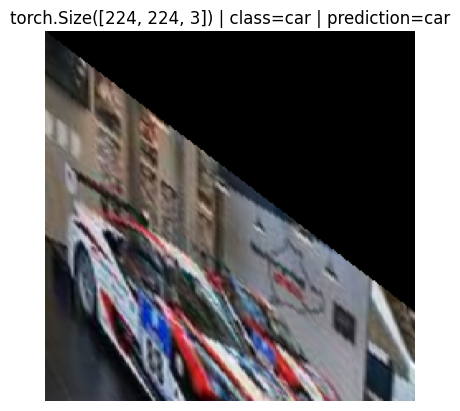

In [68]:
#plot image
img = image.permute(1,2,0)
plt.imshow(img.clamp(0,1))
plt.title(f'{img.shape} | class={class_names[label]} | prediction={class_names[torch.argmax(F.softmax(prediction,dim=1)).item()]}')
plt.axis('off')
plt.show()

Exciting, because the model has not learnt anything yet, it wrongly classifies the image as sea when instead it is street. This is good news because it shows that the transformer model is working as it should. Following this is time to train the model. I will perform 2 things here,train the architectured model from scratch with the data, and also fine-tune one from torchvision.models.Model.

Unlike tensorflow, pytorch does not have a trainer API like .fit(), it gives the flexibility to configure anything we want to add while training the model. note that this is a very huge model so it is best practice to do this on a gpu with auto_context set on the cuda-this is known as setting device agnostic which allows pytorch to use the available gpu for computation too.
Note that pytorch has a torch version 2.0+ that has a torch.compile class for faster training which inlcudes faster loading of data from the CPU to the GPU for training. The Trainer API is to show how to easily create your own trainer and validator and to give an indepth overview of what happens in the backend for these trainer apis

Next step is to configure the training loop function.

In [69]:
class Trainer():
    def __init__(self,model:torch.nn.Module,
                 base_lr:float,
                 data:torch.utils.data.Dataset,
                 criterion:torch.nn.Module,
                 num_epochs:int,
                 device:torch.device,
                 shuffle_train:bool=True,
                 shuffle_test:bool=False,
                 pin_memory:bool=None,
                 num_workers:int=0,
                 batch_size:int=32,
                 log_dir:str=None,
                 optimizer=Literal['SGD','Adam','AdamW'],
                 validation_split:float=0.3,
                 metrics=Literal['accuracy'],#expand to contain precision and recall if wanted
                 return_results:bool=True,
                 use_tqdm:bool=False):
        super(Trainer,self).__init__()
        self.data = data
        self.epochs = num_epochs
        self.shuffle_test = shuffle_test
        self.shuffle_train = shuffle_train
        self.pin_memory = pin_memory
        self.num_workers = num_workers
        self.model = model
        self.loss_fn = criterion
        self.use_tqdm = use_tqdm
        self.validation_split=validation_split
        self.device = device
        self.return_results = return_results
        self.metrics = metrics
        self.batch_size = batch_size
        self.log_dir = log_dir
        self.base_lr = base_lr
        self.optimizer = getattr(torch.optim,optimizer)(params=self.model.parameters(),
                                                        lr=self.base_lr,momentum=0.9,weight_decay=0.001)

    def train(self):
        if self.use_tqdm:
            try:
                from torch.utils.tensorboard import SummaryWriter
                from tqdm.auto import tqdm
                from torch.utils.data import random_split, DataLoader, Dataset
            except ModuleNotFoundError:
                print('[INFO] tqdm not installed-installing.....')
                !pip install tqdm tensorboard -q
                from tqdm.auto import tqdm
                from torch.utils.tensorboard import SummaryWriter
                from torch.utils.data import random_split, DataLoader, Dataset

            #print model name for training tracking
            print(f'training model: {self.model.__class__.__name__}')

            #setup dictionary to store metric values
            results = {'train_loss':[],'train_acc':[],'val_loss':[],'val_acc':[]}

            #configure dataloaders
            validation_size = int(len(self.data) * self.validation_split)
            train_size = len(self.data) - validation_size
            train_dataset,validation_dataset = random_split(self.data,[train_size,validation_size])

            #create self dataloaders
            train_dataloader_self = DataLoader(dataset=train_dataset,batch_size=self.batch_size,
                                               shuffle=self.shuffle_train,
                                               pin_memory=self.pin_memory,
                                               num_workers=self.num_workers)
            validation_dataloader_self = DataLoader(dataset=validation_dataset,
                                                    batch_size=self.batch_size,
                                                    shuffle=self.shuffle_test,
                                                    pin_memory=self.pin_memory,
                                                    num_workers=self.num_workers)

            #setup model batch training
            for epoch in tqdm(range(self.epochs),desc=f'Training for {self.epochs} epochs',total=self.epochs):
                #initialize the model train loss and accuracy at 0
                train_loss,train_acc = 0,0

                #set the model to train mode
                self.model.train().to(self.device)
                for batch,(X,y) in tqdm(enumerate(train_dataloader_self),desc='Loading Training Data',total=len(train_dataloader_self)):
                    X,y = X.to(self.device),y.to(self.device)

                    #make a prediction
                    logits = self.model(X)

                    #calculate loss
                    loss = self.loss_fn(logits,y)
                    train_loss+=loss.item()

                    #calculate accuracy
                    if self.metrics == 'accuracy':
                        acc = (torch.eq(y, torch.argmax(torch.softmax(logits, dim=1), dim=1)).sum().item()) / len(logits) * 100
                        train_acc+=acc

                    #zero gradient
                    self.optimizer.zero_grad()

                    #loss backward
                    loss.backward()

                    #optimizer step
                    self.optimizer.step()

                self.model.eval().to(self.device)
                #intislize metrics with a 0s
                val_acc,val_loss = 0,0


                for batch,(X,y) in tqdm(enumerate(validation_dataloader_self),desc='Loading Validation Data',total=len(validation_dataloader_self)):

                     X,y = X.to(self.device),y.to(self.device)

                     with torch.inference_mode():
                        logits_test = self.model(X)

                        #calculate loss
                        loss = self.loss_fn(logits_test,y)
                        val_loss+=loss.item()

                        #calculate accuracy
                        if self.metrics == 'accuracy':
                            # Corrected accuracy calculation
                            acc = (torch.eq(y, torch.argmax(torch.softmax(logits_test, dim=1), dim=1)).sum().item()) / len(logits_test) * 100
                            val_acc+=acc

                #get metrics after each epoch-retrieved from batch
                avg_val_loss = val_loss / len(validation_dataloader_self)
                avg_val_acc = val_acc / len(validation_dataloader_self)
                avg_train_loss = train_loss / len(train_dataloader_self)
                avg_train_acc = train_acc / len(train_dataloader_self)

                results['train_loss'].append(avg_train_loss)
                results['train_acc'].append(avg_train_acc)
                results['val_loss'].append(avg_val_loss)
                results['val_acc'].append(avg_val_acc)

                #setup the tensorboard for experiment tracking
                writer = SummaryWriter(log_dir=f'{self.log_dir}_{self.model.__class__.__name__}_{self.optimizer.__class__.__name__}_{self.epochs}')

                #setup for loss metric
                writer.add_scalars(main_tag='loss',tag_scalar_dict={'train_loss':avg_train_loss,'val_loss':avg_val_loss},global_step=epoch)
                writer.add_scalars(main_tag='accuracy',tag_scalar_dict={'train_acc':avg_train_acc,'val_acc':avg_val_acc},global_step=epoch)
            writer.close()

        #print(pd.DataFrame(self.return_results))
        if self.return_results:
            return pd.DataFrame(results,columns=['train_loss','train_acc','val_loss','val_acc'])
    def save(self):
        file_name = f'{self.model.__class__.__name__}_{self.optimizer.__class__.__name__}_{self.epochs}.pth'
        file_path = os.path.join('./',file_name)
        torch.save(self.model.state_dict(),file_path)
        print(f'[INFO] model saved as {file_name}')

The code is quite long and looks complex but it is not. In my trainer framework, i have taken the time to make it easier to train any model for n epochs, All you have to do is call the trainer api and pass your pytorch dataset. it will handle the splitting and  conversion of the dataset into python or pytorch accepted iterables. Then it will allows you to set shuffle for training and testing as well as the pin_memory parameter for smooth training which prevents copying of seen data values again into memory during training.

In [70]:
##setup loss function and optimizer
citerion = torch.nn.CrossEntropyLoss()

In [71]:
##test the Trainer class
trainer = Trainer(model=transformer,data=train_data,
                  criterion=citerion,
                  num_epochs=5,
                  log_dir='baseline_model/runs/',
                  base_lr=1e-3,
                  optimizer='SGD',
                  pin_memory=False,
                  device=device,
                  metrics='accuracy',
                  return_results=True,
                  use_tqdm=True,
                  batch_size=64)

In [72]:
##retrain
results_transformer = trainer.train()

training model: Transformer_for_Vision


Training for 5 epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

In [73]:
results_transformer

,train_loss,train_acc,val_loss,val_acc
0,0.801481,50.092127,0.693709,46.307683
1,0.717299,50.572485,0.694027,46.307683
2,0.703143,51.546159,0.734580,53.692317
3,0.708471,49.687838,0.692453,53.692317
4,0.730293,50.322023,0.691638,53.692317


In [74]:
##use the save method in the trainer to save the model
trainer.save()

[INFO] model saved as Transformer_for_Vision_SGD_5.pth


In [75]:
##we can check the models state dict
# Use the already instantiated 'transformer' object
print(transformer.state_dict().keys())

odict_keys(['patch_embedding.conv2d.weight', 'patch_embedding.conv2d.bias', 'patch_postions.class_tokens', 'patch_postions.patch_positions', 'encoderblock.encoder_layers.0.msa.attn.in_proj_weight', 'encoderblock.encoder_layers.0.msa.attn.in_proj_bias', 'encoderblock.encoder_layers.0.msa.attn.out_proj.weight', 'encoderblock.encoder_layers.0.msa.attn.out_proj.bias', 'encoderblock.encoder_layers.0.msa.layer_norm.weight', 'encoderblock.encoder_layers.0.msa.layer_norm.bias', 'encoderblock.encoder_layers.0.mlp.linear_layer.Linear_1.weight', 'encoderblock.encoder_layers.0.mlp.linear_layer.Linear_1.bias', 'encoderblock.encoder_layers.0.mlp.linear_layer.Linear_2.weight', 'encoderblock.encoder_layers.0.mlp.linear_layer.Linear_2.bias', 'encoderblock.encoder_layers.0.mlp.layer_norm.weight', 'encoderblock.encoder_layers.0.mlp.layer_norm.bias', 'encoderblock.encoder_layers.1.msa.attn.in_proj_weight', 'encoderblock.encoder_layers.1.msa.attn.in_proj_bias', 'encoderblock.encoder_layers.1.msa.attn.out_p

In [76]:
# Instantiate a new model with the same architecture parameters as the saved model
loaded_transformer = Transformer_for_Vision(num_layers=12,embed_dim=1024,num_heads=32,
                                            img_size=224,patch_size=16,
                                            hidden_size=512,scale_factor=8,
                                            num_classes=len(class_names),dropout=0.001,
                                            bias=True).to(device)

# Load the saved state dictionary into the new model instance
loaded_transformer.load_state_dict(torch.load('Transformer_for_Vision_SGD_5.pth'))

print("Saved model loaded successfully!")

Saved model loaded successfully!


In [77]:
#check the model size
import pathlib
transformer_model_size = pathlib.Path('/content/Transformer_for_Vision_SGD_5.pth').stat().st_size//(1024*1024)
print('model size is ',transformer_model_size,'MB')

model size is  580 MB


Wonderful, the results of the model training for 10 epochs shows that even with a fresh model we can achieve descent results if done properly. Note that, model complexity is not always directly proportional to best performance and sometimes restriction is the way to go. Machine/Deep Learning is a experimentative field and not a walk in the park. A model can look or perform well pre-deployment and fail post-deployment. So keep experimenting and ensure to keep the test data far away from the training of the model. Lets make inference with the trained model.

In [78]:
class_names = test_data.classes
class_names

['car', 'flower']

In [79]:
##define a function that takes the trained model, an image and class label
##this function will plot the image and the actual class as well as the model's prediction
##use %%writefile to make script .eg make_pred_plot.py
def make_pred_and_plot(model:torch.nn.Module,data:torch.utils.data.Dataset,figsize:Tuple[int,int]):
    #set data loader in the function
    data = DataLoader(dataset=data,shuffle=True,batch_size=10)

    #get a random image
    images,labels = next(iter(data))
    image,label = images[0],labels[0]

    #apply transformation to image
    #image_transformed = transform_image(image).to(device)
    image_permute = image.permute(1,2,0)


    with torch.inference_mode():
        image = image.unsqueeze(dim=0).to(device)
        logits = model(image) #moddel expects shape (batch_size,color_channel,height,width)
        prediction_probabilities = F.softmax(logits,dim=1) #returns an array of probablities
        highest_pred_prob,highest_index = torch.max(prediction_probabilities,dim=1)
        class_prediction = class_names[highest_index.item()]

    #plot the image and label
    prediction_accuracy = 'Yes' if class_names[label]==class_prediction else 'No'
    plt.figure(figsize=figsize)
    plt.imshow(image_permute.cpu().clamp(0,1))
    plt.title(f'{image_permute.shape}|actual={class_names[label]}|model_prediction={class_prediction} (prob={highest_pred_prob.item():.2f})| Correct_prediction?:{prediction_accuracy}')
    plt.axis('off')
    plt.show()


In [80]:
val_data = ImageFolder(root=train_dir,transform=test_transformations)

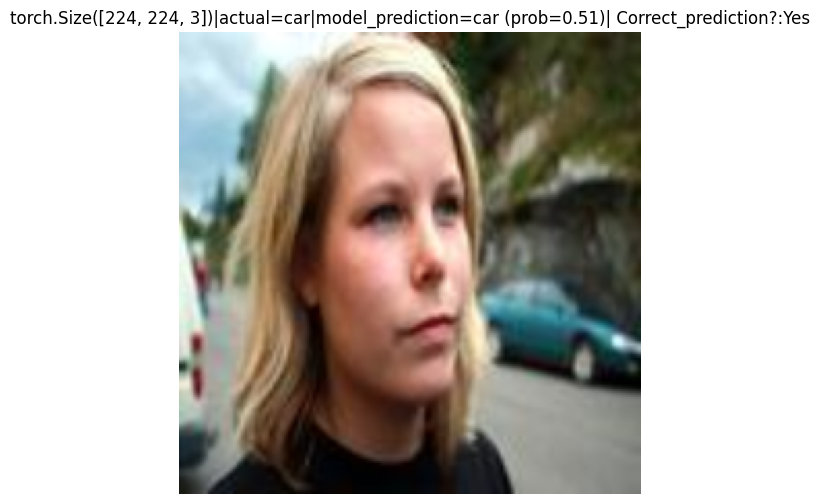

In [81]:
#test the function on the in-sample data
make_pred_and_plot(model=loaded_transformer,data=test_data,figsize=(8,6))

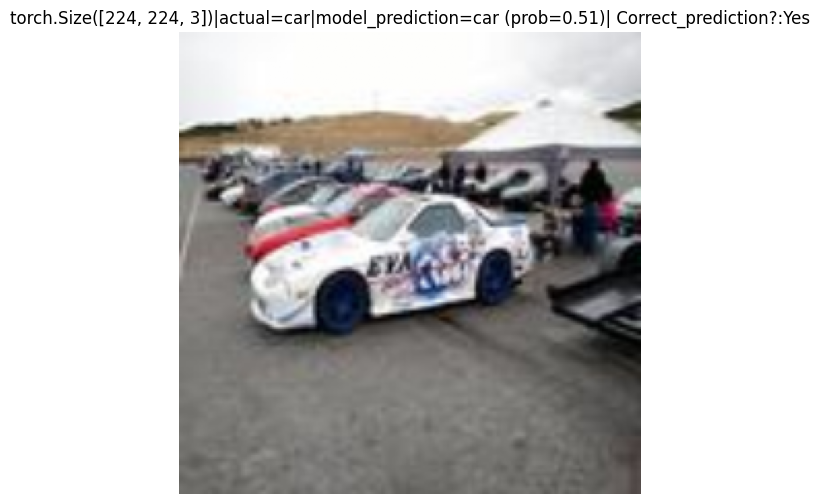

In [82]:
##try on the test data
make_pred_and_plot(model=loaded_transformer,data=test_data,figsize=(8,6))

this goes to show that the model clearly overfitted to the training data as it is not generalizing to the test data. machine learning is experimentational so it is right for you to suspect anything and verity by experimenting. i suspect that too much augmentation may be causing the model to overfit.why? images that lack the augmnetation or transformations causes the model to suffer in predicting them. Lets experiment.

In [83]:
#for the val_data created lets use the a transformas.normalize on them
new_t = transforms.Compose([transforms.Resize((224,224)),
    #transforms.TrivialAugmentWide(num_magnitude_bins=31),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.25,0.457,0.268],std=[0.35,0.557,0.368]) ])#set a normalizer for the image tensors

val_data = ImageFolder(root=test_dir,transform=new_t)
val_data_l = DataLoader(dataset=val_data,batch_size=8,shuffle=True)

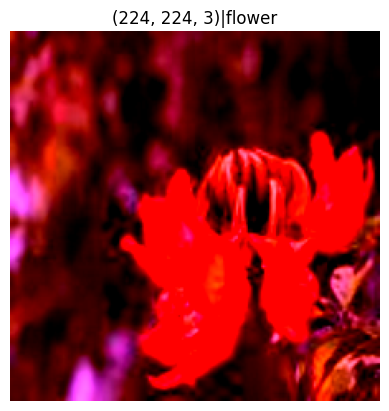

In [84]:
##view one image
images,labels = next(iter(val_data_l))
image,label = images[0],labels[0]
image = image.permute(1,2,0)
image = np.array(image.clamp(0,1))
#image = image.permute(1,2,0)
plt.imshow(image)
plt.title(f'{image.shape}|{class_names[label]}')
plt.axis('off');

okay so we now have a function that takes a random image from the test dataset, and makes a prediction with the trained model as well as plotting the image and adding its actual class and the model's predicted class. Now what if we want to use just a random image not from the test dataset, but just any random image say from the internet, lets do that.

As expected the model although shows a good training and validation score, fails to genaeralize on newer images fed to it. This is highlighted by the researchers in their paper 'A image is  16x16 sequence of images'. the researchers highligted that the model will always when it not fed with sufficient data. In my example i used 30% of the train data for validation, this could be the result of this good performance as the model may have been receiving leaked data from the train set. Now lets try to use the actual test data for validation and all the train data for training. Then we will experiment with even smaller patches, more dense embeddings and then compare the results. 'Machine Learning is not just a walk in the park'.

In [85]:
##lets see how a pretrained model will perform
##looad vit_b_16 model
model_weights = torchvision.models.ViT_B_16_Weights.DEFAULT
model_vit_b_16 = torchvision.models.vit_b_16(weights=model_weights)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:01<00:00, 242MB/s]


In [86]:
#freeze the extractors
for param in model_vit_b_16.parameters():
    param.requires_grad=False

In [87]:
model_vit_b_16.heads = nn.Linear(in_features=768, out_features=len(class_names)).to(device)

In [88]:
#view the model
torchinfo.summary(model_vit_b_16,input_size=(32,3,224,224),col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                        Input Shape               Output Shape              Trainable
VisionTransformer                             [32, 3, 224, 224]         [32, 2]                   Partial
├─Conv2d: 1-1                                 [32, 3, 224, 224]         [32, 768, 14, 14]         False
├─Encoder: 1-2                                [32, 197, 768]            [32, 197, 768]            False
│    └─Dropout: 2-1                           [32, 197, 768]            [32, 197, 768]            --
│    └─Sequential: 2-2                        [32, 197, 768]            [32, 197, 768]            False
│    │    └─EncoderBlock: 3-1                 [32, 197, 768]            [32, 197, 768]            False
│    │    └─EncoderBlock: 3-2                 [32, 197, 768]            [32, 197, 768]            False
│    │    └─EncoderBlock: 3-3                 [32, 197, 768]            [32, 197, 768]            False
│    │    └─EncoderBlock: 3-4                 [32, 197, 768] 

In [89]:
##train the pretrained model
trainer = Trainer(model=model_vit_b_16,data=train_data,
                  criterion=citerion,
                  num_epochs=5,
                  log_dir='baseline_model/runs/',
                  base_lr=0.0001,
                  optimizer='SGD',
                  pin_memory=False,
                  device=device,
                  metrics='accuracy',
                  return_results=True,
                  use_tqdm=True,
                  batch_size=64)
results_vit_16 = trainer.train()

training model: VisionTransformer


Training for 5 epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/118 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/51 [00:00<?, ?it/s]

In [90]:
results_vit_16

,train_loss,train_acc,val_loss,val_acc
0,0.574736,71.896975,0.436848,86.524890
1,0.384501,89.007280,0.335876,91.034905
2,0.316623,91.153534,0.289129,92.260396
3,0.280148,92.057620,0.254625,93.093940
4,0.256346,92.442752,0.235042,93.890509


clearly the pretrained vision transformer model outweighed the one we built. This is highly expected as the pretrained model is one of the best models out there. It is trained extensively on enormous quantity of data and hence has rich weights good enough to extract features from any image. lets check its prediction after we save the model.

In [91]:
##save the  mmodel
trainer.save()

[INFO] model saved as VisionTransformer_SGD_5.pth


In [92]:
#check model size
model_vit16_size = pathlib.Path('/content/VisionTransformer_SGD_5.pth').stat().st_size//(1024*1024)
print('vit pretrained model has size',model_vit16_size,'MB')

vit pretrained model has size 327 MB


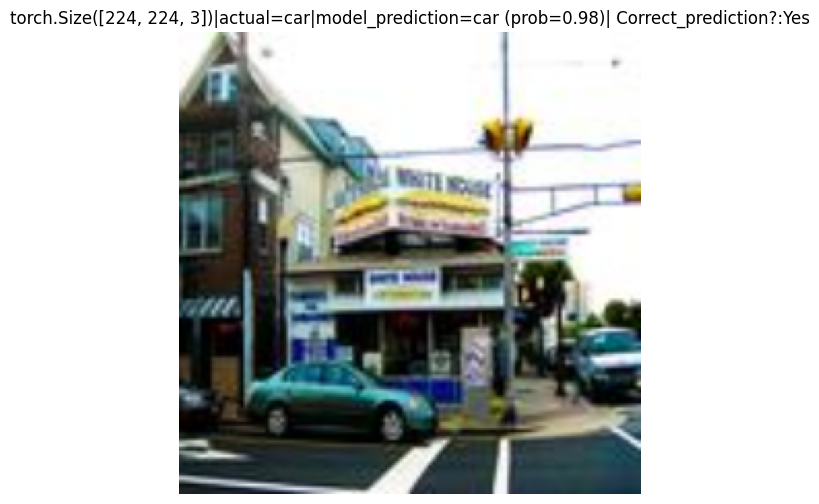

In [93]:
##loading model and making predictions
# Load the state dictionary into the model_vit_b_16 object
model_vit_b_16.load_state_dict(torch.load('/content/VisionTransformer_SGD_5.pth'))

# Now call make_pred_and_plot with the loaded model_vit_b_16 object
make_pred_and_plot(model=model_vit_b_16,data=test_data,figsize=(8,6))

In [94]:
random_images = list(pathlib.Path('/content/image_data').glob('*/*/*.jpg'))
len(random_images)

13438

In [95]:
##this will look like the same function as above however, this time the image wont be of type torch.utils.data.DataLoader
#rather it will just be a string of a path to the image in the directory.

def plot_random_image(model:torch.nn.Module,images,figsize:Tuple[int,int],sample_size:int=4,seed=None):
    #load random images
    random_images = list(pathlib.Path(images).glob('*/*/*.jpg'))
    random_sample = random.sample(random_images,k=sample_size)

    #set seed
    if seed:
        random.seed(seed)

    #get the image from the path
    from tqdm.auto import tqdm
    for idx, image in tqdm(enumerate(random_sample,start=1),total=len(random_sample)):
        image = Image.open(image)

        #apply transformation
        transformed = torchvision.transforms.Compose(
        [transforms.Resize((224,224)),
         transforms.ToTensor()]
        )
        transform_image = transformed(image)

        #permute the image for matplotlib plotting (color_channel,Height,Width)->(height,width,color_channel)
        image_permute = transform_image.permute(1,2,0)

        #make prediction with model
        with torch.inference_mode():
            image = transform_image.unsqueeze(dim=0).to(device)
            logits = model(image) #moddel expects shape (batch_size,color_channel,height,width)
            prediction_probabilities = F.softmax(logits,dim=1) #returns an array of probablities
            highest_pred_prob,highest_index = torch.max(prediction_probabilities,dim=1)
            class_prediction = class_names[highest_index.item()]

        #plot the image input with class predicted
        plt.figure(figsize=figsize)
        plt.subplot(1,len(random_sample),idx)
        plt.imshow(image_permute)
        plt.title(f'{image_permute.shape}|model prediction = {class_prediction}| Prob={highest_pred_prob.item():.2f}',fontsize=8)
        plt.axis('off')
        plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

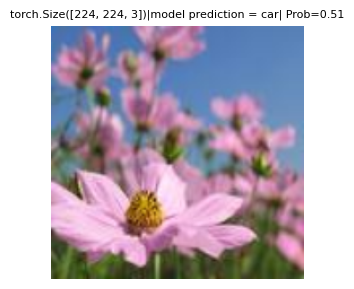

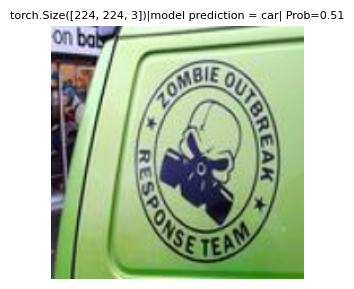

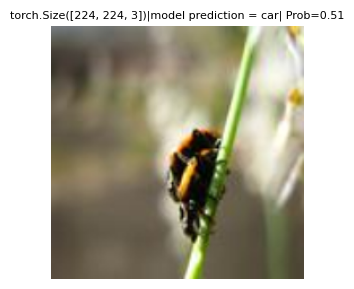

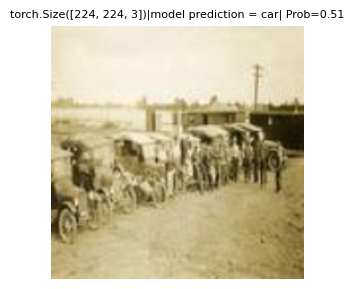

In [96]:
#test on random image with
plot_random_image(model=loaded_transformer,images='/content/image_data',figsize=(15,6))

  0%|          | 0/4 [00:00<?, ?it/s]

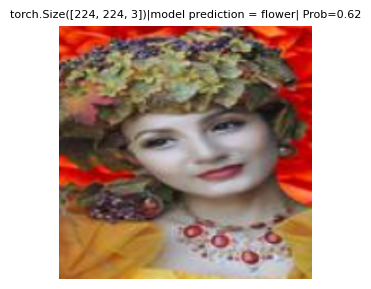

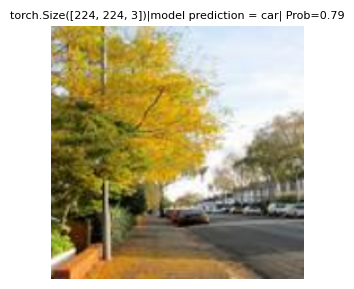

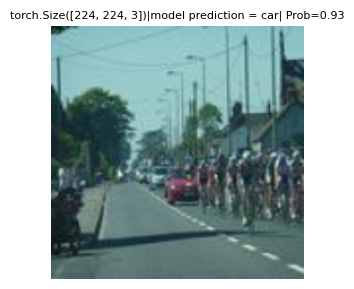

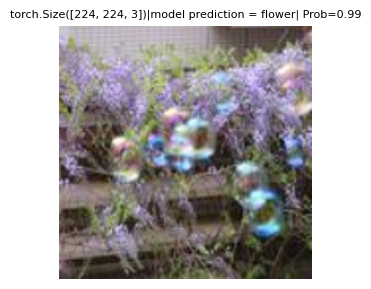

In [97]:
#test on random image with
plot_random_image(model=model_vit_b_16,images='/content/image_data/',figsize=(15,6))

In [98]:
##setting up the CNN based model for comparison

#get model weights
cnn_weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT

#get model model transforms
cnn_transforms = cnn_weights.transforms()

#get model
cnn_model = torchvision.models.efficientnet_b0(weights=cnn_weights)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 236MB/s]


In [99]:
torchinfo.summary(cnn_model,input_size=(1,3,224,224),col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                                  Input Shape               Output Shape              Trainable
EfficientNet                                            [1, 3, 224, 224]          [1, 1000]                 True
├─Sequential: 1-1                                       [1, 3, 224, 224]          [1, 1280, 7, 7]           True
│    └─Conv2dNormActivation: 2-1                        [1, 3, 224, 224]          [1, 32, 112, 112]         True
│    │    └─Conv2d: 3-1                                 [1, 3, 224, 224]          [1, 32, 112, 112]         True
│    │    └─BatchNorm2d: 3-2                            [1, 32, 112, 112]         [1, 32, 112, 112]         True
│    │    └─SiLU: 3-3                                   [1, 32, 112, 112]         [1, 32, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 32, 112, 112]         [1, 16, 112, 112]         True
│    │    └─MBConv: 3-4                                 [1, 32, 112, 112]         [1, 16, 112

In [100]:
##freeze layers of the cnn
for param in cnn_model.parameters():
    param.requires_grad = False

##customize the final dense layer
cnn_model.classifier = nn.Sequential(
    OrderedDict([
        ('Dropout',nn.Dropout(p=0.5)),
        ('Linear',nn.Linear(in_features=1280, out_features=len(class_names)))
    ]))

In [101]:
##view differcne after changing the model trainable parameters
torchinfo.summary(cnn_model,input_size=(1,3,224,224),col_names=['input_size','output_size','trainable'])

Layer (type:depth-idx)                                  Input Shape               Output Shape              Trainable
EfficientNet                                            [1, 3, 224, 224]          [1, 2]                    Partial
├─Sequential: 1-1                                       [1, 3, 224, 224]          [1, 1280, 7, 7]           False
│    └─Conv2dNormActivation: 2-1                        [1, 3, 224, 224]          [1, 32, 112, 112]         False
│    │    └─Conv2d: 3-1                                 [1, 3, 224, 224]          [1, 32, 112, 112]         False
│    │    └─BatchNorm2d: 3-2                            [1, 32, 112, 112]         [1, 32, 112, 112]         False
│    │    └─SiLU: 3-3                                   [1, 32, 112, 112]         [1, 32, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 32, 112, 112]         [1, 16, 112, 112]         False
│    │    └─MBConv: 3-4                                 [1, 32, 112, 112]         [1,

In [102]:
#create new train dataset
cnn_train_data = ImageFolder(root=train_dir,transform=cnn_transforms)

In [103]:
##train the model with built trainer class
trainer = Trainer(model=cnn_model,data=cnn_train_data,
                  criterion=citerion,
                  num_epochs=5,
                  log_dir='baseline_model/runs/',
                  base_lr=1e-3,
                  optimizer='SGD',
                  pin_memory=False,
                  device=device,
                  metrics='accuracy',
                  return_results=True,
                  use_tqdm=True,
                  batch_size=32)

In [104]:
#call train function
cnn_results = trainer.train()

training model: EfficientNet


Training for 5 epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/236 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/101 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/236 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/101 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/236 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/101 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/236 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/101 [00:00<?, ?it/s]

Loading Training Data:   0%|          | 0/236 [00:00<?, ?it/s]

Loading Validation Data:   0%|          | 0/101 [00:00<?, ?it/s]

In [105]:
cnn_results

,train_loss,train_acc,val_loss,val_acc
0,0.347068,87.231638,0.211745,94.489374
1,0.226291,91.960629,0.179566,94.424292
2,0.202387,92.263418,0.159989,95.201007
3,0.198491,92.240466,0.151760,95.414391
4,0.195861,92.369350,0.152625,95.104985


In [106]:
##save model
trainer.save()

[INFO] model saved as EfficientNet_SGD_5.pth


In [107]:
%load_ext tensorboard
%tensorboard --logdir './baseline_model/runs/'

<IPython.core.display.Javascript object>

In [108]:
##check model size for efficientnet
#check model size
cnn_model_size= pathlib.Path('/content/EfficientNet_SGD_5.pth').stat().st_size//(1024*1024)
print('cnn pretrained model has size',cnn_model_size,'MB')

cnn pretrained model has size 15 MB


In [109]:
#load model state dict
cnn_model.load_state_dict(torch.load('/content/EfficientNet_SGD_5.pth'))

<All keys matched successfully>

relatively smaller model size, good for deployment
performance-wise, it performs closely similar to the pretrained vit model

In [110]:
list(pathlib.Path('/content/image_data/test_set').glob('*/*.jpg'))

[PosixPath('/content/image_data/test_set/flower/fe92bdd6d8b91a26.jpg'),
 PosixPath('/content/image_data/test_set/flower/fef07cf1d989dc5b.jpg'),
 PosixPath('/content/image_data/test_set/flower/ffe8557ad9ee5ab5.jpg'),
 PosixPath('/content/image_data/test_set/flower/fdc94d5bde93f6c9.jpg'),
 PosixPath('/content/image_data/test_set/flower/ff31fd26c2caffa9.jpg'),
 PosixPath('/content/image_data/test_set/flower/ff27ae81347b5a9d.jpg'),
 PosixPath('/content/image_data/test_set/flower/fde28240c1f1b0f7.jpg'),
 PosixPath('/content/image_data/test_set/flower/fdb159b856b069e2.jpg'),
 PosixPath('/content/image_data/test_set/flower/fe6cd09c282cc35f.jpg'),
 PosixPath('/content/image_data/test_set/flower/fd97d770ca686a35.jpg'),
 PosixPath('/content/image_data/test_set/flower/fcdf7fd7d391ba0e.jpg'),
 PosixPath('/content/image_data/test_set/flower/ffbf9a562f8d7206.jpg'),
 PosixPath('/content/image_data/test_set/flower/ffd802b3781f9f5b.jpg'),
 PosixPath('/content/image_data/test_set/flower/feb0566803cf5348

In [111]:
##define a function to plot images from out-of-sample data
def predict_and_save(model:torch.nn.Module,
                  data_folder:str,
                  sample_size:int,
                  class_names:List[str],
                  plot:bool=False,
                  seed=None):
    if seed:
        random.seed(seed)
    #get paths
    image_paths = list(pathlib.Path(data_folder).glob('*/*.jpg'))

    #sample size for prediction
    random_image_paths = random.sample(image_paths,k=sample_size)

    #iterate through posixpaths for images
    from tqdm.auto import tqdm
    from timeit import default_timer as timer
    from torchvision import transforms
    #create empty list for storing dictionary of results
    prediction_list = []
    for idx,image_path in tqdm(enumerate(random_image_paths),desc='Loading OOS data', total=len(random_image_paths)):
        #create dictionary for storing predictions
        pred_dict = {}
        #store each image path
        pred_dict['image_path'] = image_path

        #store image stem
        pred_dict['image_class'] = image_path.parent.stem

        #start time for prediction
        start_time = timer()

        #make predictions
        image = Image.open(image_path)

        #make transformations
        image_resize = transforms.Compose([transforms.Resize((224,224)),transforms.ToTensor()])

        #apply transforms to images
        image = image_resize(image) #shape (height,width,color_channels)

        #make pred
        with torch.inference_mode():
            logits = model(image.unsqueeze(dim=0).to(device)).to(device)
            #get probs
            probs = torch.softmax(logits,dim=1)
            #get index
            highest_pred_prob,highest_index = torch.max(probs,dim=1)
            class_prediction = class_names[highest_index.item()]

            #save the prediction probs and prediction classes
            pred_dict['pred_prob'] = highest_pred_prob.item()
            pred_dict['prediction_class'] = class_prediction
            pred_dict['Correct?'] = 'Yes' if image_path.parent.stem == class_prediction else 'No'

            #get end time
            end_time = timer()
            pred_dict['time_for_pred'] = f'{(end_time-start_time):.2f}'

        if plot:
            plt.figure(figsize=(15,5))
            plt.subplot(1,len(random_image_paths),idx+1)
            img_permute = image.permute(1,2,0)
            #imshow
            plt.imshow(img_permute)
            plt.title(f'{img_permute.shape}|actual label = {image_path.parent.stem} prediction = {class_prediction}')
            plt.axis('off')
        #append dicitonary to list
        prediction_list.append(pred_dict)
    print(f'[INFO] successfully finished predictions with model {model.__class__.__name__}')
    return prediction_list

In this case, I use the function I created above to make predictions on 10 random images and it returns their prediction probabilities and the respective class as well as time taken for predictions. This is a cool function because it automates predictions and even allows users to visualize the image and the predictions

In [112]:
#test function
results_vit_self = predict_and_save(model=loaded_transformer,
                 data_folder='/content/image_data/test_set',
                 sample_size=10,
                 class_names=class_names,plot=False)

Loading OOS data:   0%|          | 0/10 [00:00<?, ?it/s]

[INFO] successfully finished predictions with model Transformer_for_Vision


In [113]:
results_vit_self=pd.DataFrame(results_vit_self)
results_vit_self

,image_path,image_class,pred_prob,prediction_class,Correct?,time_for_pred
0,/content/image_data/test_set/flower/fe654b2336...,flower,0.512925,car,No,0.01
1,/content/image_data/test_set/car/fdae044e2ab1f...,car,0.508486,car,Yes,0.01
2,/content/image_data/test_set/flower/fe480755d5...,flower,0.511766,car,No,0.01
3,/content/image_data/test_set/car/ff9935dc2ce3d...,car,0.512109,car,Yes,0.01
4,/content/image_data/test_set/car/ffabf61e5443c...,car,0.512973,car,Yes,0.01
5,/content/image_data/test_set/car/fdc95a8565367...,car,0.511733,car,Yes,0.01
6,/content/image_data/test_set/car/feb56cc7fb10e...,car,0.508704,car,Yes,0.01
7,/content/image_data/test_set/car/fd23cfb9ec424...,car,0.511748,car,Yes,0.01
8,/content/image_data/test_set/car/fee65d455166b...,car,0.512265,car,Yes,0.01
9,/content/image_data/test_set/car/fef0955aebb4a...,car,0.511852,car,Yes,0.01


In [114]:
#use effnet model
results_cnn_model = predict_and_save(model=cnn_model,
                 data_folder='/content/image_data/test_set',
                 sample_size=10,
                 class_names=class_names,plot=False)

Loading OOS data:   0%|          | 0/10 [00:00<?, ?it/s]

[INFO] successfully finished predictions with model EfficientNet


In [115]:
results_cnn_model=pd.DataFrame(results_cnn_model)
results_cnn_model

,image_path,image_class,pred_prob,prediction_class,Correct?,time_for_pred
0,/content/image_data/test_set/car/ff150f9c87ee5...,car,0.523848,car,Yes,0.01
1,/content/image_data/test_set/flower/fddbda07bd...,flower,0.927956,flower,Yes,0.01
2,/content/image_data/test_set/flower/fe26d35bc2...,flower,0.881388,flower,Yes,0.01
3,/content/image_data/test_set/flower/ff87a7afe5...,flower,0.588559,flower,Yes,0.01
4,/content/image_data/test_set/flower/ffaf4f8a43...,flower,0.517040,flower,Yes,0.01
5,/content/image_data/test_set/car/fe0aef5d3dd8e...,car,0.726010,flower,No,0.01
6,/content/image_data/test_set/car/ff29a4acfc4c8...,car,0.623588,flower,No,0.01
7,/content/image_data/test_set/flower/fdc6f4e701...,flower,0.990888,flower,Yes,0.01
8,/content/image_data/test_set/car/fe134ec761682...,car,0.654670,flower,No,0.01
9,/content/image_data/test_set/flower/ffdfbafb1e...,flower,0.944663,flower,Yes,0.01


In [116]:
##using visiion ttrandformer
results_vit_pretrained = predict_and_save(model=model_vit_b_16,
                 data_folder='/content/image_data/test_set',
                 sample_size=10,
                 class_names=class_names,plot=False)
results_vit_pretrained=pd.DataFrame(results_vit_pretrained)
results_vit_pretrained

Loading OOS data:   0%|          | 0/10 [00:00<?, ?it/s]

[INFO] successfully finished predictions with model VisionTransformer


,image_path,image_class,pred_prob,prediction_class,Correct?,time_for_pred
0,/content/image_data/test_set/flower/fe2785bfd1...,flower,0.905720,flower,Yes,0.01
1,/content/image_data/test_set/car/ffd1093b9f7d3...,car,0.933210,car,Yes,0.01
2,/content/image_data/test_set/car/ff99689b07f06...,car,0.715735,car,Yes,0.01
3,/content/image_data/test_set/flower/fddb5edeb6...,flower,0.766577,flower,Yes,0.01
4,/content/image_data/test_set/car/ffa70fcf64511...,car,0.853135,car,Yes,0.01
5,/content/image_data/test_set/car/fd768ae445fc1...,car,0.979446,car,Yes,0.01
6,/content/image_data/test_set/car/fe81556bed2cc...,car,0.913542,car,Yes,0.01
7,/content/image_data/test_set/car/fd17ffc4823ee...,car,0.544834,car,Yes,0.01
8,/content/image_data/test_set/flower/fcdcf08eab...,flower,0.539287,car,No,0.01
9,/content/image_data/test_set/car/fd9c2d5a1bea6...,car,0.666018,car,Yes,0.01


Now, its time to compare model statistics for inference and deployment purposes.
Clearly both the CNN based model-EffnetB0 and the Vit_16 model perform much better than my own created model. But i will include it in my analysis for sake of clarity. To compare the models, I wil create a new dataframe from the results returned by eahc model creation

In [117]:
##collect all models' results
results_stats = {'train_acc_mean':[results_transformer['train_acc'].mean(),cnn_results['train_acc'].mean(),results_vit_16['train_acc'].mean()],
                             'test_acc_mean':[results_transformer['val_acc'].mean(),cnn_results['val_acc'].mean(),results_vit_16['val_acc'].mean()],
                             'train_loss_mean':[results_transformer['train_loss'].mean(),cnn_results['train_loss'].mean(),results_vit_16['train_loss'].mean()],
                             'test_loss_mean':[results_transformer['val_loss'].mean(),cnn_results['val_loss'].mean(),results_vit_16['val_loss'].mean()],}

In [118]:
model_comparison = pd.DataFrame(results_stats)
#include model names
model_comparison['model'] = ['self_transformer','cnn_model','vit_16_model']

In [119]:
#view dataframe
model_comparison['time_pred'] = [results_vit_self['time_for_pred'].astype(float).mean(),
                                 results_cnn_model['time_for_pred'].astype(float).mean(),
                                 results_vit_pretrained['time_for_pred'].astype(float).mean()]
model_comparison['model_size'] = [transformer_model_size,model_vit16_size,cnn_model_size]

In [120]:
model_comparison

,train_acc_mean,test_acc_mean,train_loss_mean,test_loss_mean,model,time_pred,model_size
0,50.444126,50.738463,0.732137,0.701281,self_transformer,0.01,580
1,91.213100,94.926809,0.234019,0.171137,cnn_model,0.01,327
2,87.311632,91.360928,0.362471,0.310304,vit_16_model,0.01,15


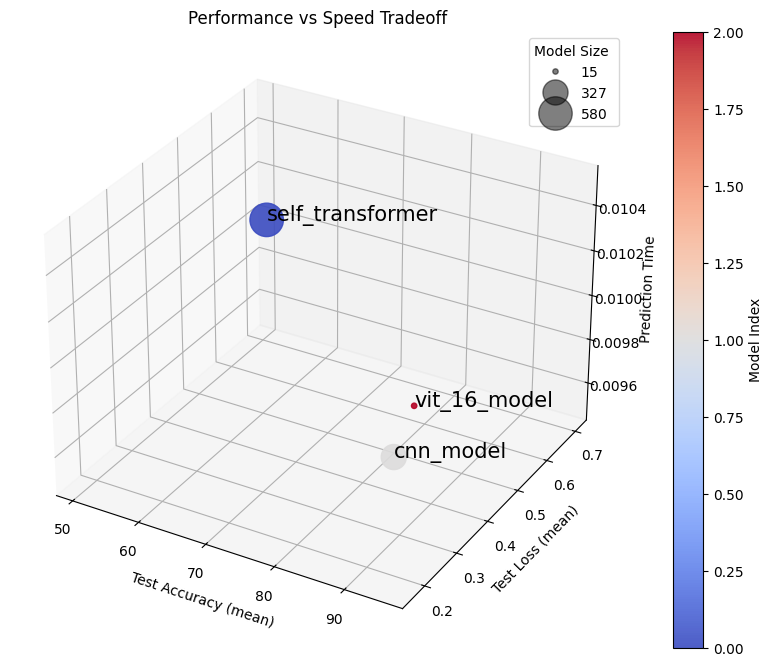

In [121]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

xs = model_comparison['test_acc_mean']
ys = model_comparison['test_loss_mean']
zs = model_comparison['time_pred']
sizes = model_comparison['model_size']
colors = model_comparison['model']

im = ax.scatter(xs, ys, zs,
                s=sizes,
                c=range(len(model_comparison)),
                cmap='coolwarm',
                alpha=0.9)

fig.colorbar(im, ax=ax, label="Model Index")

ax.set_xlabel('Test Accuracy (mean)')
ax.set_ylabel('Test Loss (mean)')
ax.set_zlabel('Prediction Time')
ax.set_title('Performance vs Speed Tradeoff')

for index, row in model_comparison.iterrows():
    ax.text(row["test_acc_mean"],
            row["test_loss_mean"],
            row["time_pred"],
            row["model"],
            size=15)

handles, labels = im.legend_elements(prop="sizes", alpha=0.5)
ax.legend(handles, labels,
          loc="upper right",
          title="Model Size ")

plt.show()

From the image above we see the model comparison for all three models
the smallest model being the cnn model and largest and most non-performing one being the model I created. This is expected as it takes a whole lot of training data and training epochs to get a transformer model to work efficiently.Per this plot,i can confidently say that the effnet model deserves to be deployed as it is smaller, and has almost no difference in model performance and speed compared ot the vit_16 model.

to deploy any ML model, it is imperative to consider where and how the model will be used. there are several ways to deploying ML models which inlcude and mostly famous edge/local server and cloud based deployment. As such, we must always take into account latency(performance and time at inference) as well as throughput(amount of data the model can process at a time). Larger models will usually take longer to perform inference whereas smaller models take relatively less time. The speed of performance also depends on the system hardware where usually gpu systems have faster inference times compared to cpus. For this case study, I will be deploying on gradio which provides a faster way to test a model in the real-world scenario.

In [122]:
##get gradio
try:
    import gradio as gr
except ModuleNotFoundError:
    print('[INFO] module gradio not found, installing..........')
    !pip install gradio -q
    import gradio as gr

gradio provides as interface for ML workflow which involves taking an input->model/function->output
the model input can vary based on use case. The output too
so it is imperative to always consider what ML model is you are working on and the end goal
gradio provides an abstraction called gradio.Interface(fn,input,output): the parameters for the Interface abstraction include fn->function to perform inference, input->input data and output->output model produces

In [131]:
##defining the fn parameter
#this is going to be similar to the pred_and_save fucntion
def model_predictions(image):
    try:
        from timeit import default_timer as timer
        import torch
        import torchvision
        from torchvision import transforms
        from PIL import Image
    except ModuleNotFoundError:
        !pip install -q torch torchvision -q
        from timeit import default_timer as timer
        import torch
        import torchvision
        from torchvision import transforms
        from PIL import Image
        from pathlib import Path
    #start calculating time
    start_time = timer()

    #open image path
    #image = Image.open(image)

    #apply transform
    model_transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor()
    ])

    transformed_image = model_transform(image)

    #perform prediction
    cnn_model.eval().to('cpu')
    with torch.inference_mode():
        #get logits
        logits = cnn_model(transformed_image.unsqueeze(dim=0).to('cpu'))
        #get probs and highest index
        probs = torch.softmax(logits,dim=1)
        #get index
        highest_pred_prob,highest_index = torch.max(probs,dim=1)
        class_prediction = class_names[highest_index.item()]
    #get the class labels and probs for each label prediction
    pred_label_prob = {class_names[i]: float(probs[0][i]) for i in range(len(class_names))}

    #get final time
    end_time = timer()

    #calculate time difference
    time_difference = round(end_time-start_time,3)

    #return pred_lable_probs and time diff
    return pred_label_prob, time_difference

In [128]:
##the function takes an image and make prediction on it
##test it
image_path = list(pathlib.Path(test_dir).glob('*/*.jpg'))
one_image = image_path[2400]
one_image

PosixPath('/content/image_data/test_set/car/fed049e6015c02fe.jpg')

In [129]:
model_predictions(image=one_image)

({'car': 0.7863572835922241, 'flower': 0.2136426717042923}, 0.036)

Now I have a function that can fit the function parameter, so its time to create the gradio workflow

In [133]:
##we have gradio already imported lets run
demo = gr.Interface(fn=model_predictions,
                    inputs=gr.Image(label='Upload Image here', type='pil'),
                    outputs=[gr.Label(num_top_classes=len(class_names)),gr.Number(label='Prediction time(s)')],
                    title='Image Classification With Pytorch Demo',
                    )
#launch
demo.launch(inline=True, debug=True, share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://2a046b9e220e496420.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


ERROR:    Exception in ASGI application
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/protocols/http/h11_impl.py", line 403, in run_asgi
    result = await app(  # type: ignore[func-returns-value]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/middleware/proxy_headers.py", line 60, in __call__
    return await self.app(scope, receive, send)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/fastapi/applications.py", line 1134, in __call__
    await super().__call__(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/applications.py", line 107, in __call__
    await self.middleware_stack(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/errors.py", line 186, in __call__
    raise exc
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/errors.py",

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://2a046b9e220e496420.gradio.live
